## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---


# Camera Calibration

First, the camera calibration is done using chessboard images. in Code below the corners are found and shown on the chessboard images:

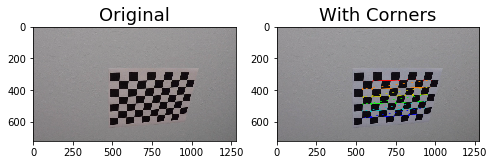

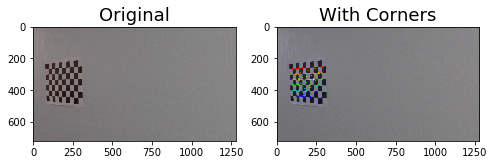

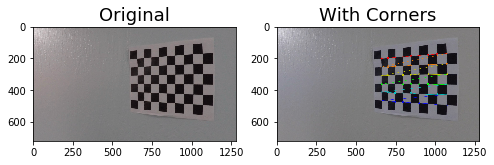

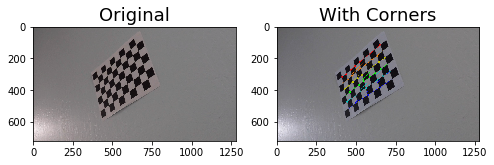

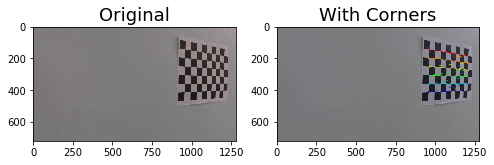

...

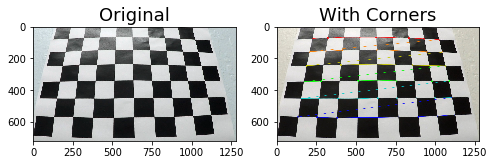

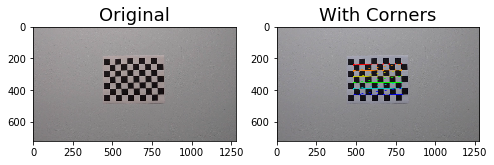

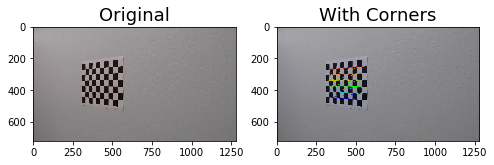

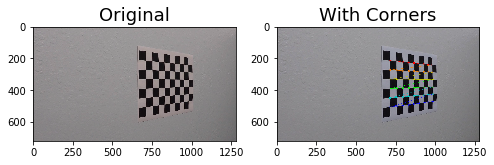

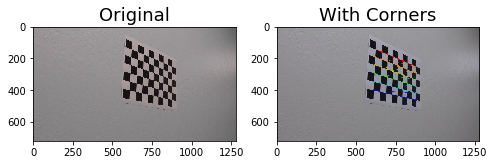

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

# prepare object points,
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.
images = glob.glob('camera_cal/calibration*.jpg')

for i, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        
        # show image
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
        ax1.imshow(cv2.cvtColor(mpimg.imread(fname), cv2.COLOR_BGR2RGB))
        ax1.set_title('Original', fontsize=18)
        ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax2.set_title('With Corners', fontsize=18)        

Then the camera calibration parameters are calculated and distortion is removed from images using cal_undistort function:

In [2]:
# Remove distortion from images
def cal_undistort(img):
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    return undist

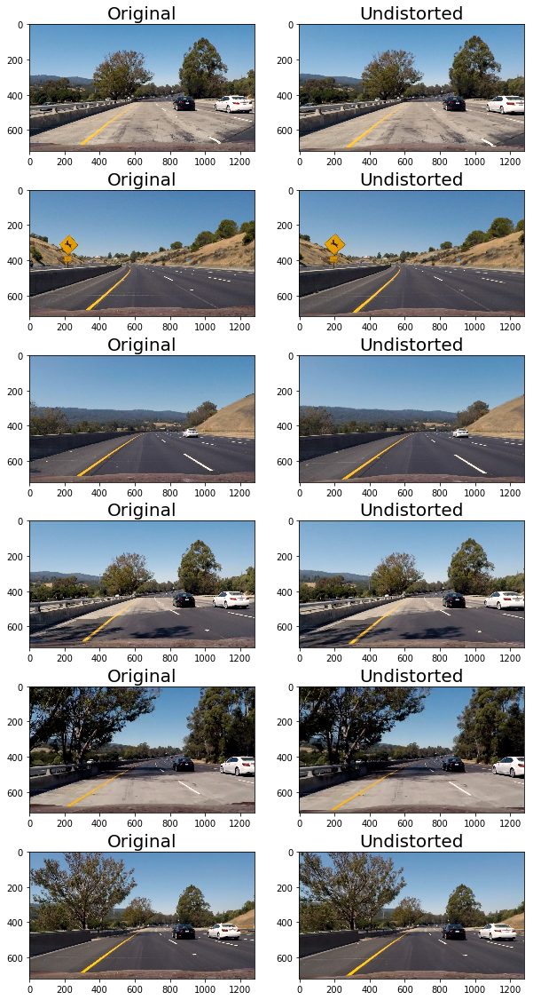

In [42]:
images = glob.glob('test_images/test*.jpg')
f=plt.figure(figsize=(10, 20))
for i, image in enumerate(images):
    img = cv2.imread(image)
    undist = cal_undistort(img)
    plt.subplot(6, 2, 2*i+1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original', fontsize=20)
    plt.subplot(6, 2, 2*i+2)
    plt.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
    plt.title('Undistorted', fontsize=20)    
   

## Perspective Transformation

Then the perspective is transformed to get a bird's eye view of the road. To perform this transformation we can imagine a trnasformation from dash camera view (Trapezoid) to the bird's eye view (rectangle); the camera view is captured in src and the bird's eye view is represented by dst arrays:

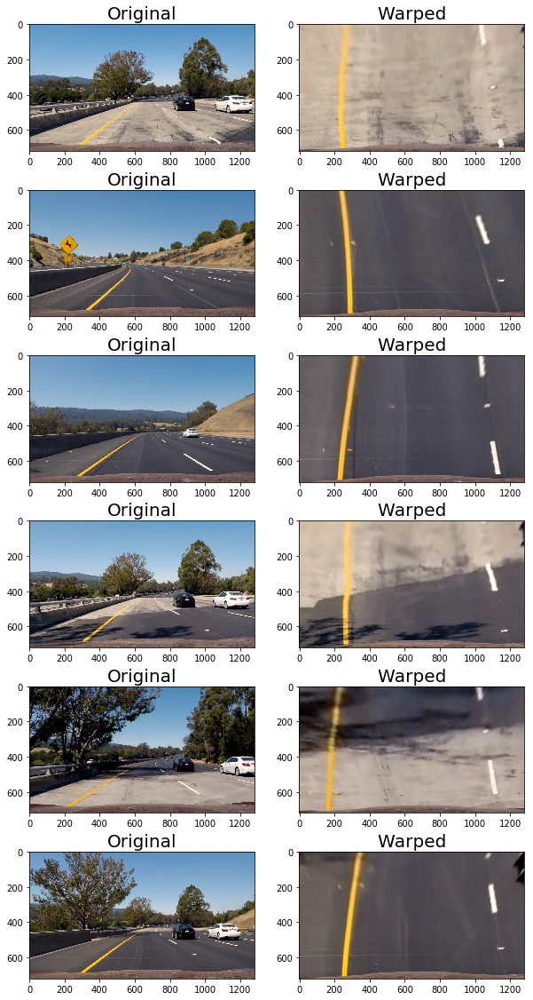

In [24]:
# Perform perspective transform
def Perspective_Trans(img):
    undist = cal_undistort(img)
    img_size = (undist.shape[1], undist.shape[0])
    offset = 0
    src = np.float32([[500, 480],[820, 480],
                      [1260, 720],[50, 720]])
    dst = np.float32([[10, 0], [1290, 0], 
                     [1260, 720],[50, 720]])    
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(undist, M, img_size)

    return warped, M

f=plt.figure(figsize=(10, 20))
for i, image in enumerate(images):
    img = cv2.imread(image)
    warped, M = Perspective_Trans(img)
    plt.subplot(6, 2, 2*i+1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original', fontsize=20)
    plt.subplot(6, 2, 2*i+2)
    plt.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
    plt.title('Warped', fontsize=20) 
    

## Gradient Threshold

The function below calculates the gradient of the image in selected direction and applies thresholds:

In [28]:
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # 3) Take the absolute value of the derivative or gradient
    abs_sobelx = np.absolute(abs_sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    #plt.imshow(sxbinary, cmap='gray')
    # 6) Return this mask as a binary_output image
    binary_output = sxbinary
    return binary_output

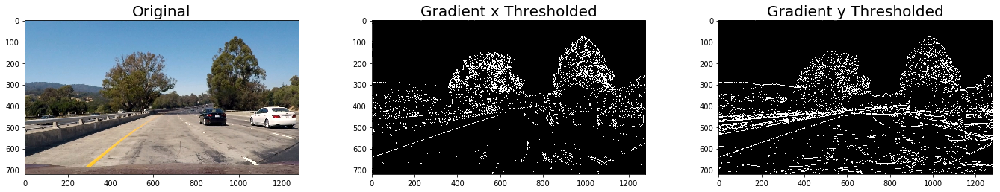

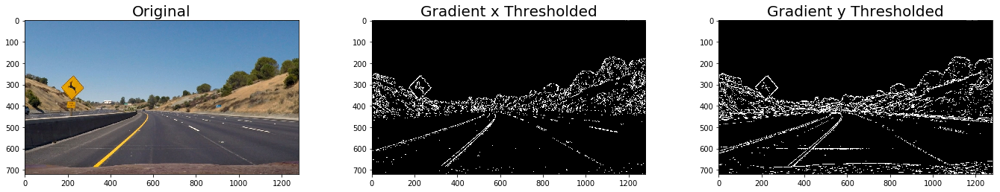

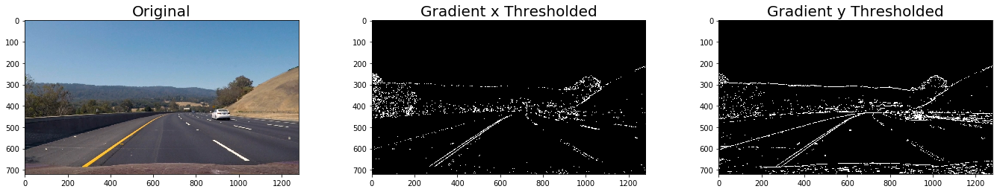

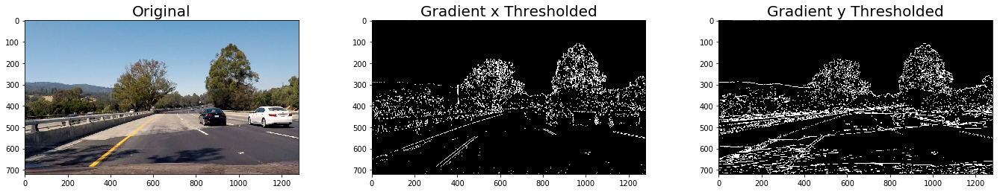

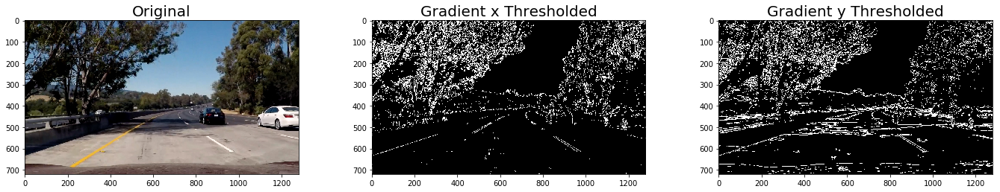

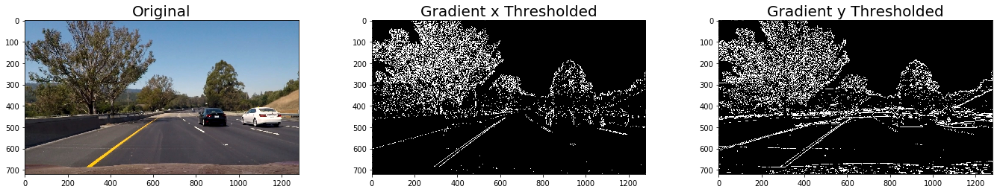

In [30]:
  
for image in glob.glob('test_images/test*.jpg'):
    img = cv2.imread(image)
    gradx = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
    grady = abs_sobel_thresh(img, orient='y', thresh_min=20, thresh_max=100)
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(9, 6))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original', fontsize=20)
    ax2.imshow(gradx, cmap='gray')
    ax2.set_title('Gradient x Thresholded', fontsize=20)
    ax3.imshow(grady, cmap='gray')
    ax3.set_title('Gradient y Thresholded', fontsize=20)    
    plt.subplots_adjust(left=0.0, right=2, top=1, bottom=0.)

## Magnitude of Gradient Thresholding

The fundtion below calculates the magnitude of the gradients and thresholds that:

In [39]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    abs_sobelxy = np.sqrt(abs_sobelx*abs_sobelx + abs_sobely*abs_sobely)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    # 5) Create a binary mask where mag thresholds are met
    sxybinary = np.zeros_like(scaled_sobel)
    sxybinary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    # 6) Return this mask as the binary_output image
    binary_output = sxybinary
    return binary_output

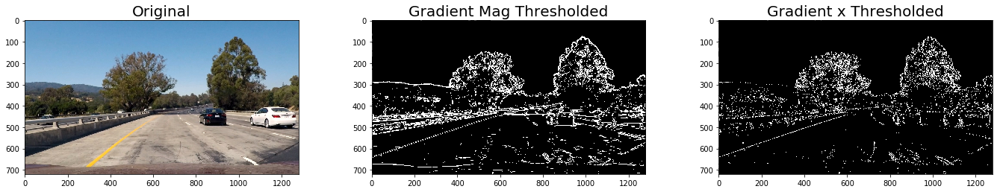

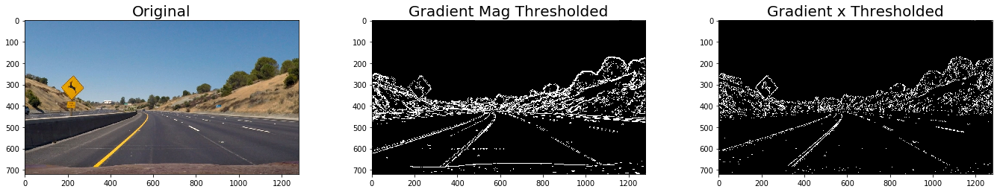

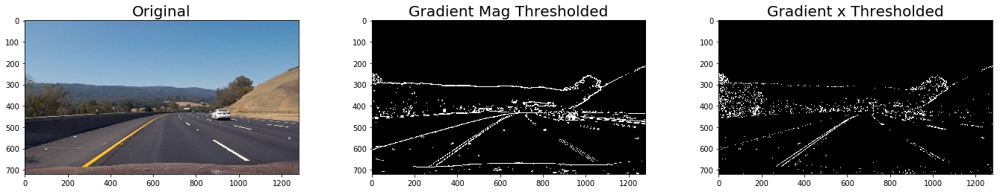

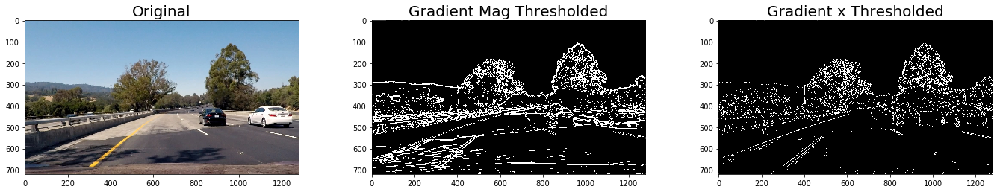

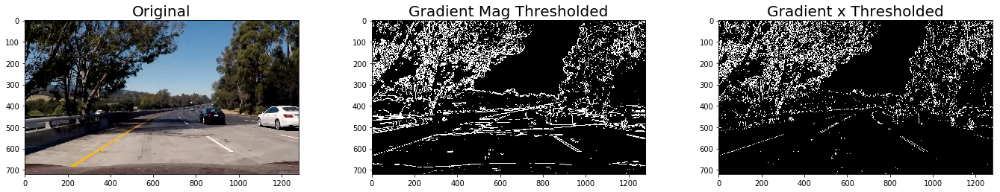

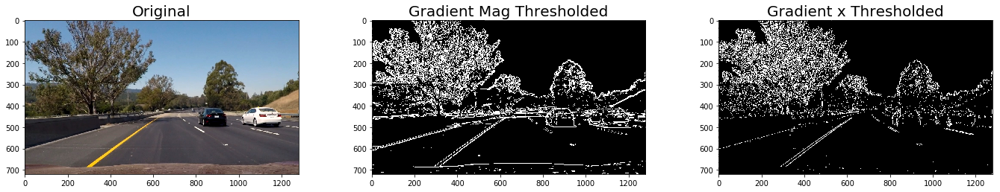

In [8]:
for image in glob.glob('test_images/test*.jpg'):
    img = cv2.imread(image)
    mag_binary = mag_thresh(img, sobel_kernel=9, mag_thresh=(30, 100))
    gradx = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(9, 6))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original', fontsize=20)
    ax2.imshow(mag_binary, cmap='gray')
    ax2.set_title('Gradient Mag Thresholded', fontsize=20)
    ax3.imshow(gradx, cmap='gray')
    ax3.set_title('Gradient x Thresholded', fontsize=20)
    plt.subplots_adjust(left=0., right=2, top=1, bottom=0.) 

## Gradient Direction

The function below calculates the direction of gradient and thresholds that to just get the vertical lines (the ones that are close to what we're interested in):

In [38]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

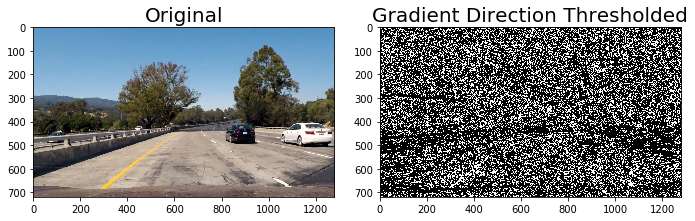

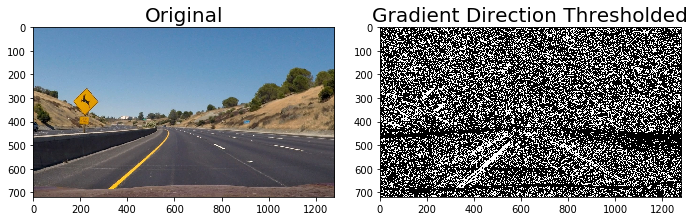

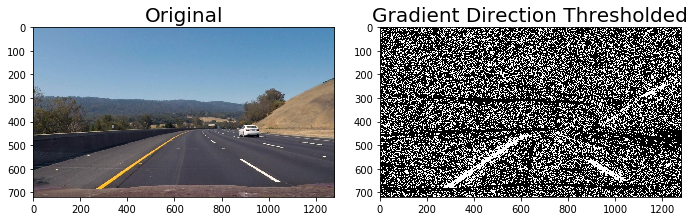

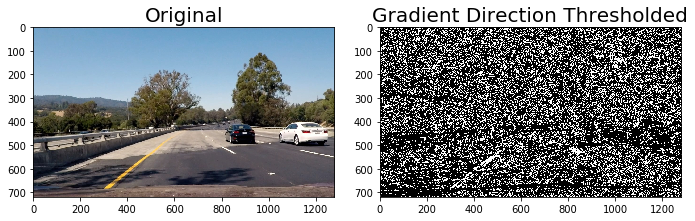

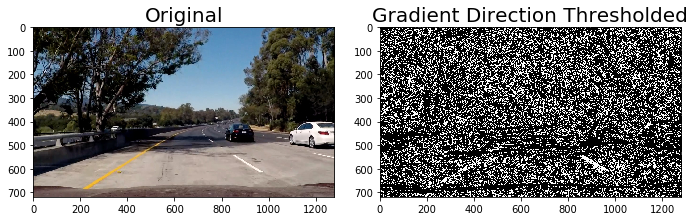

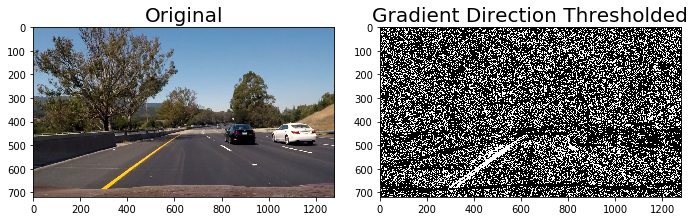

In [35]:
for image in glob.glob('test_images/test*.jpg'):
    img = cv2.imread(image)
    dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.2))
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 6))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original', fontsize=20)
    ax2.imshow(dir_binary, cmap='gray')
    ax2.set_title('Gradient Direction Thresholded', fontsize=20)
    plt.subplots_adjust(left=0., right=1, top=1, bottom=0.)

## Combining Gradient Thresholds

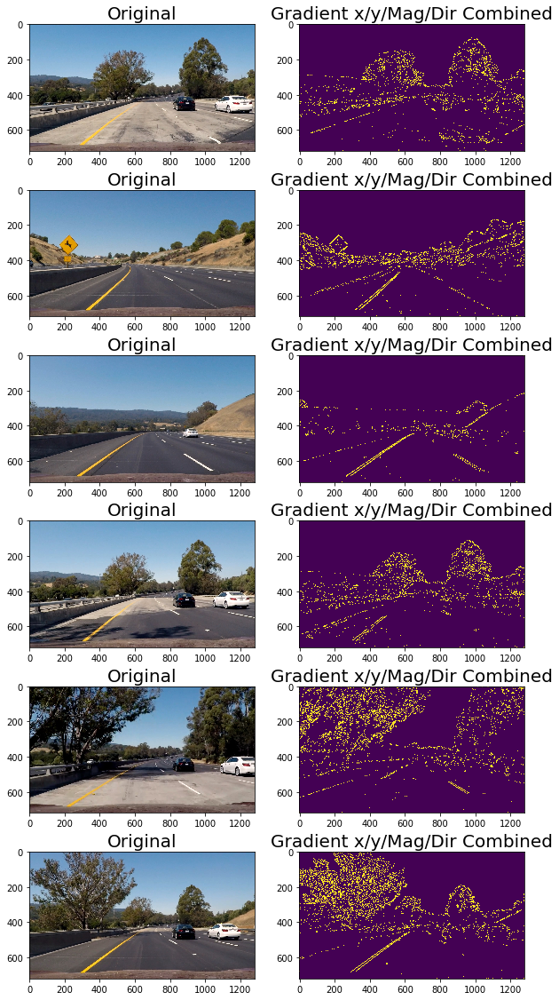

In [48]:
images = glob.glob('test_images/test*.jpg')
f=plt.figure(figsize=(10, 20))
for i, image in enumerate(images):
    img = cv2.imread(image)
    undist = cal_undistort(img)
    gradx = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
    grady = abs_sobel_thresh(img, orient='y', thresh_min=20, thresh_max=100)    
    dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.2))
    mag_binary = mag_thresh(img, sobel_kernel=9, mag_thresh=(30, 100))
    
    combined_binary = np.zeros_like(dir_binary)
    combined_binary[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1   
    plt.subplot(6, 2, 2*i+1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original', fontsize=20)
    plt.subplot(6, 2, 2*i+2)
    plt.imshow(combined_binary)
    plt.title('Gradient x/y/Mag/Dir Combined', fontsize=20)   


## Color Thresholding:

The S channel is thresholded in function below:

In [50]:
def hls_select(img, thresh=(0, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    # 2) Apply a threshold to the S channel
    binary = np.zeros_like(S)
    binary[(S > thresh[0]) & (S <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    binary_output = binary# np.copy(img) # placeholder line
    return binary_output    

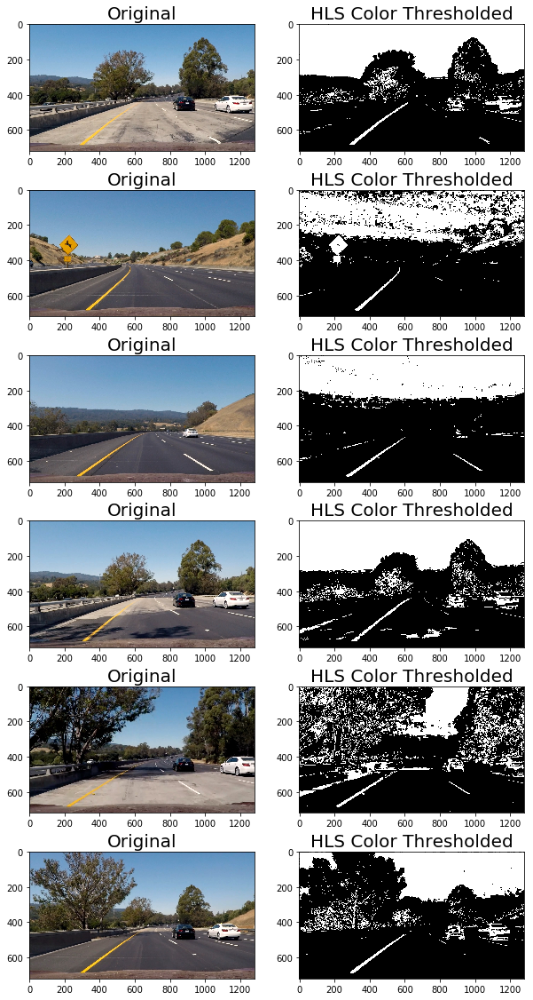

In [52]:
images = glob.glob('test_images/test*.jpg')
f=plt.figure(figsize=(10, 20))
for i, image in enumerate(images):
    img = cv2.imread(image)
    hls_binary = hls_select(img, thresh=(100, 255))
    plt.subplot(6, 2, 2*i+1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original', fontsize=20)
    plt.subplot(6, 2, 2*i+2)
    plt.imshow(hls_binary, cmap='gray')
    plt.title('HLS Color Thresholded', fontsize=20)
    

## Combining Gradient and Color Thresholds

C:\Users\Hojjat\AppData\Local\conda\conda\envs\carnd-term1\lib\site-packages\ipykernel_launcher.py:29: DeprecationWarning: `imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.


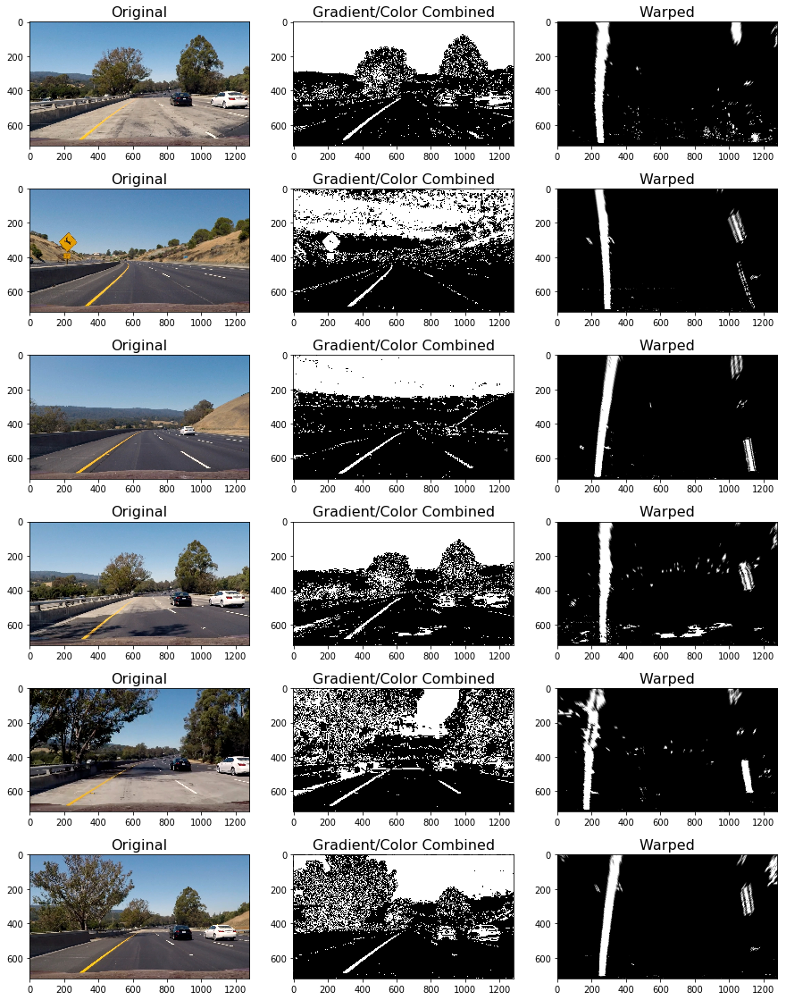

In [54]:
import scipy.misc

images = glob.glob('test_images/test*.jpg')
f=plt.figure(figsize=(15, 20))
for i, image in enumerate(images):
    img = cv2.imread(image)

    gradx = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
    grady = abs_sobel_thresh(img, orient='y', thresh_min=20, thresh_max=100)    
    dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.2))
    mag_binary = mag_thresh(img, sobel_kernel=9, mag_thresh=(30, 100))
    hls_binary = hls_select(img, thresh=(100, 255))
    
    combined_binary = np.zeros_like(dir_binary)
    combined_binary[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1)) | (hls_binary == 1)] = 1
    
    warped, M = Perspective_Trans(combined_binary) 
    plt.subplot(6, 3, 3*i+1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original', fontsize=16)
    plt.subplot(6, 3, 3*i+2)
    plt.imshow(combined_binary, cmap='gray')
    plt.title('Gradient/Color Combined', fontsize=16)
    plt.subplot(6, 3, 3*i+3)
    plt.imshow(warped, cmap='gray')
    plt.title('Warped', fontsize=16)    
    
    fname = 'combined_images\combined_binary'+ str(i)+'.jpg'
    scipy.misc.imsave(fname, combined_binary)
     

## Fitting Polynomial To Lane Lines

In [55]:
def fit_poly_lane(binary_warped):
    #binary_warped = warped#cv2.imread(image)
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    #plt.plot(histogram) 

    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    #print(left_lane_inds.shape)
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    #findinf line radius
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    #print(left_curverad, right_curverad)

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])   
    
    return left_fit, right_fit, out_img, \
           left_curverad, right_curverad

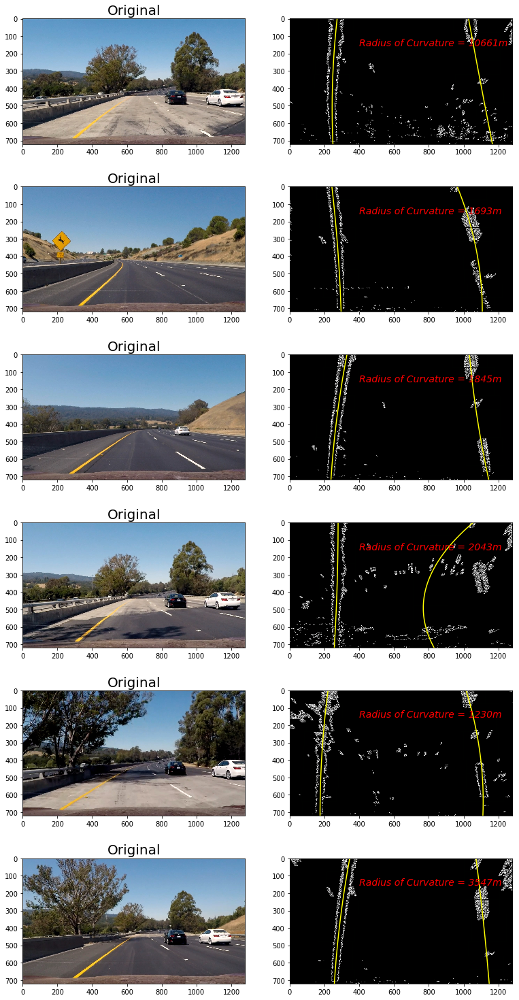

In [62]:
images = glob.glob('test_images/test*.jpg')
f=plt.figure(figsize=(10, 20))
for i, image in enumerate(images):
    img = cv2.imread(image)
    gradx = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
    grady = abs_sobel_thresh(img, orient='y', thresh_min=20, thresh_max=100)    
    dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.2))
    mag_binary = mag_thresh(img, sobel_kernel=9, mag_thresh=(30, 100))
    hls_binary = hls_select(img, thresh=(100, 255))
    
    combined_binary = np.zeros_like(dir_binary)
    combined_binary[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1)) | (hls_binary == 1)] = 1
    
    binary_warped, M = Perspective_Trans(combined_binary)
    
    left_fit, right_fit, out_img, left_curverad, right_curverad \
    = fit_poly_lane(binary_warped)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    plt.subplot(6, 2, 2*i+1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original', fontsize=20)
    plt.subplot(6, 2, 2*i+2)
    plt.imshow(out_img, cmap='gray')
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.text(400, 155, 'Radius of Curvature = {}m'.format(int((left_curverad + right_curverad)/2)),
             style='italic', color='red', fontsize=14)    
    plt.subplots_adjust(left=0., right=1, top=1, bottom=0.)
   

In [65]:
def lane_filler(image):
   
    img = cv2.imread(image)
    gradx = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
    grady = abs_sobel_thresh(img, orient='y', thresh_min=20, thresh_max=100)    
    dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.2))
    mag_binary = mag_thresh(img, sobel_kernel=9, mag_thresh=(30, 100))
    hls_binary = hls_select(img, thresh=(100, 255))
    
    combined_binary = np.zeros_like(dir_binary)
    combined_binary[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1)) | (hls_binary == 1)] = 1
    
    binary_warped, M = Perspective_Trans(combined_binary)
    
    left_fit, right_fit, out_img, left_curverad, right_curverad \
    = fit_poly_lane(binary_warped)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    center = abs(640 - ((left_fitx[0]+right_fitx[0])/2))
    
    offset = 0 
    img_size = (img.shape[1], img.shape[0])
    src = np.float32([[500, 480],[820, 480],
                      [1260, 720],[50, 720]])
    dst = np.float32([[10, 0], [1290, 0], 
                     [1260, 720],[50, 720]])    
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warp_zero = np.zeros_like(combined_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.flipud(np.transpose(np.vstack([left_fitx, ploty])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, ploty]))])
    pts = np.hstack((pts_left, pts_right))
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    newwarp = cv2.warpPerspective(color_warp, Minv, (combined_binary.shape[1], combined_binary.shape[0]))
    lane_filled_image = cv2.addWeighted(mpimg.imread(image), 1, newwarp, 0.5, 0)
    
    return center, left_curverad, right_curverad, lane_filled_image
    

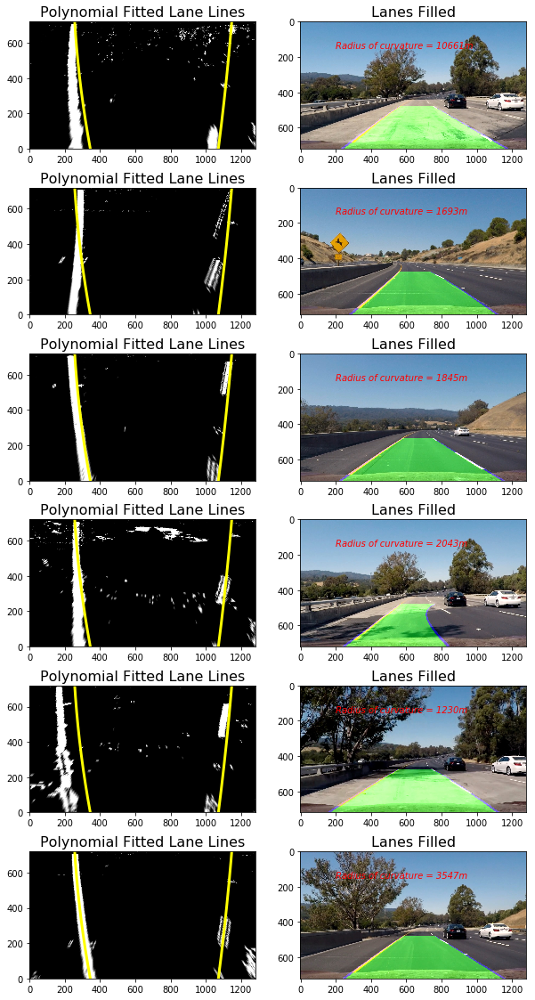

In [74]:
images = glob.glob('test_images/test*.jpg')
f=plt.figure(figsize=(10, 20))
for i, image in enumerate(images):
    img = cv2.imread(image)
    center, left_curverad, right_curverad, lane_filled_image = lane_filler(image)

    gradx = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
    grady = abs_sobel_thresh(img, orient='y', thresh_min=20, thresh_max=100)    
    dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.2))
    mag_binary = mag_thresh(img, sobel_kernel=9, mag_thresh=(30, 100))
    hls_binary = hls_select(img, thresh=(100, 255))
    
    combined_binary = np.zeros_like(dir_binary)
    combined_binary[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1)) | (hls_binary == 1)] = 1
    
    binary_warped, M = Perspective_Trans(combined_binary)
    
     # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

   
    plt.subplot(6, 2, 2*i+1)
    plt.imshow(binary_warped, cmap='gray')
    plt.xlim(0, 1280)
    plt.ylim(0, 720)
    plt.plot(left_fitx, ploty, color='yellow', linewidth=3)
    plt.plot(right_fitx, ploty, color='yellow', linewidth=3)
    plt.title('Polynomial Fitted Lane Lines', fontsize=16)
    #plt.invert_yaxis() # to visualize as we do the images
    plt.subplot(6, 2, 2*i+2)
    plt.imshow(lane_filled_image)
    plt.title('Lanes Filled', fontsize=16)
    plt.text(200, 150, 'Radius of curvature = {}m'.format(int((left_curverad + right_curverad)/2)),
             style='italic', color='red', fontsize=10)
    


# Video Processing

In [76]:
def video_processor(image):
    img_size = (image.shape[1], image.shape[0])
    
    # Calibrate camera and undistort image
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    
    #find lanes
    img = undist # cv2.imread(image)
    gradx = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
    grady = abs_sobel_thresh(img, orient='y', thresh_min=20, thresh_max=100)    
    dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.2))
    mag_binary = mag_thresh(img, sobel_kernel=9, mag_thresh=(30, 100))
    hls_binary = hls_select(img, thresh=(100, 255))
    
    combined_binary = np.zeros_like(dir_binary)
    combined_binary[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1)) | (hls_binary == 1)] = 1
    
    binary_warped, M = Perspective_Trans(combined_binary)
    
    left_fit, right_fit, out_img, left_curverad, right_curverad \
    = fit_poly_lane(binary_warped)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    center = abs(640 - ((left_fitx[0]+right_fitx[0])/2))
    
    offset = 0 
    img_size = (img.shape[1], img.shape[0])
    src = np.float32([[500, 480],[820, 480],
                      [1260, 720],[50, 720]])
    dst = np.float32([[10, 0], [1290, 0], 
                     [1260, 720],[50, 720]])    
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warp_zero = np.zeros_like(combined_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.flipud(np.transpose(np.vstack([left_fitx, ploty])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, ploty]))])
    pts = np.hstack((pts_left, pts_right))
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    newwarp = cv2.warpPerspective(color_warp, Minv, (combined_binary.shape[1], combined_binary.shape[0]))
    lane_filled_image = cv2.addWeighted(undist, 1, newwarp, 0.5, 0)    
        
    # Print radius of curvature on video
    cv2.putText(lane_filled_image, 'Radius of Curvature {}(m)'.format(int((left_curverad+right_curverad)/2)), (150,150),
             fontFace = 16, fontScale = 2, color=(255,0,0), thickness = 2)

    return lane_filled_image

In [78]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

video_output = 'harder_challenge_video_out.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4")#.subclip(0,2)
#video_clip.reader.close()
#video_clip.audio.reader.close_proc()
white_clip = clip1.fl_image(video_processor) 
white_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video harder_challenge_video_out.mp4
[MoviePy] Writing video harder_challenge_video_out.mp4


100%|███████████████████████████████████████████████████████████████████████▉| 1199/1200 [44:51<00:02,  2.05s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_out.mp4 

